# Image Stitching with opencv

In [1]:
# Image stitching

from imutils import paths
import numpy as np
import argparse
import imutils
import cv2
from pprint import pprint
import matplotlib.pyplot as plt


def stitche_image(image_folder):
    print("[INFO] loading images...")
    imagePaths = sorted(list(paths.list_images(image_folder)))
    images = []

    # images to stitch list
    for imagePath in imagePaths:
        image = cv2.imread(imagePath)
        images.append(image)

    stitcher = cv2.Stitcher_create()
    (status, stitched) = stitcher.stitch(images)

    return stitched




[INFO] loading images...


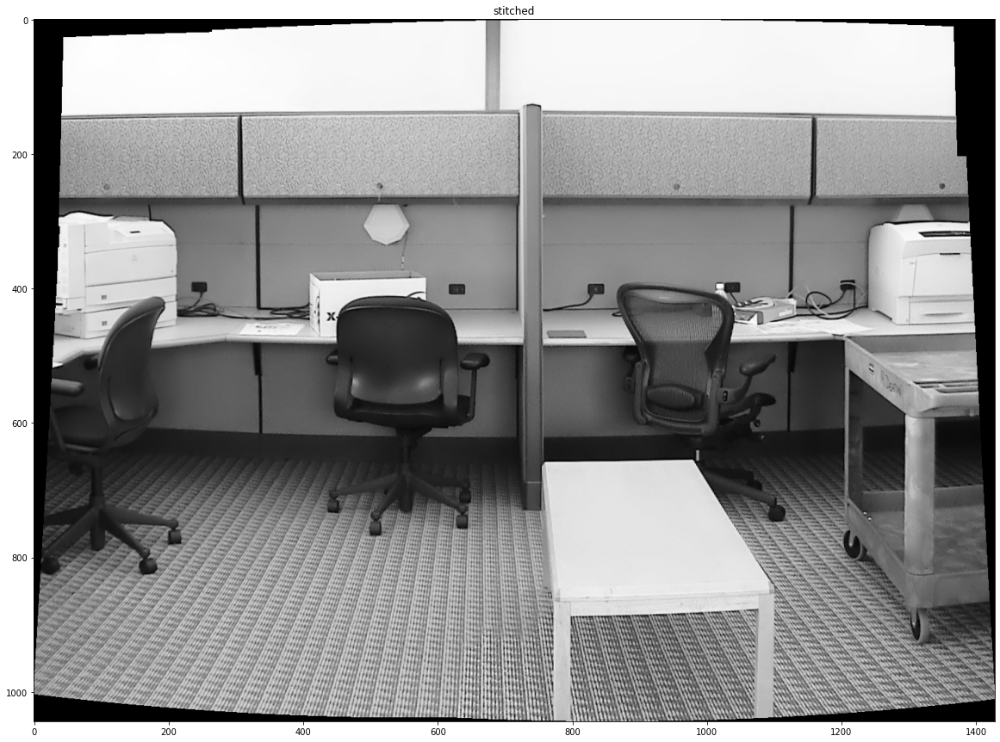

In [2]:
image_folder = "./data/office"

stitched = stitche_image(image_folder)

plt.figure(figsize=(20, 15))
plt.imshow(stitched, cmap='gray', vmin=0, vmax=255)
plt.title("stitched")
plt.show()



[INFO] loading images...


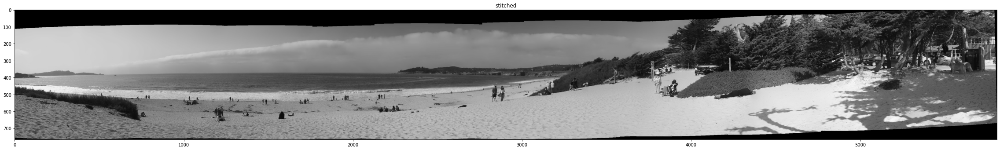

In [4]:
image_folder = "./data/carmel"

stitched= stitche_image(image_folder)

plt.figure(figsize=(40, 30))
plt.imshow(stitched, cmap='gray', vmin=0, vmax=255)
plt.title("stitched")
plt.show()

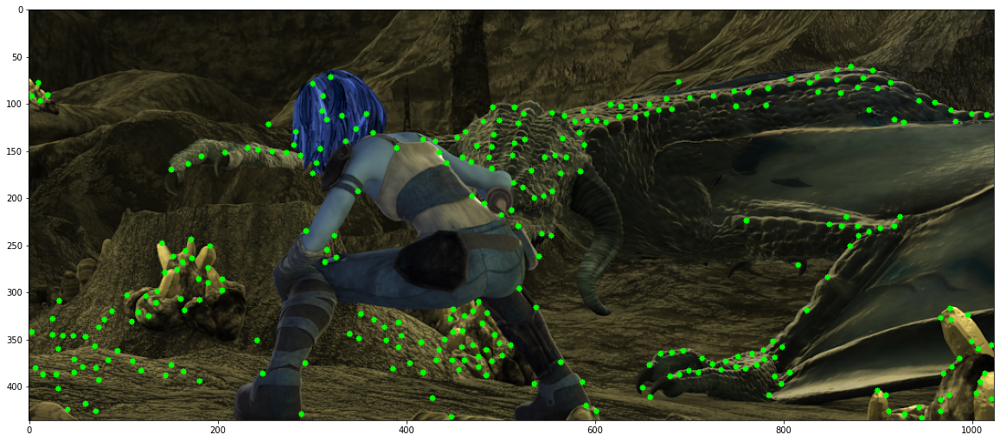

In [1]:
# 1c good feature to track
import numpy as np
import cv2
from imutils import paths
import matplotlib.pyplot as plt
from scipy import signal

img = cv2.imread('./data/cave_3/frame_0001.png')
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
corners = cv2.goodFeaturesToTrack(gray,300,0.01,10)
corners = np.int0(corners)
for i in corners:
    x,y = i.ravel()
    cv2.circle(img,(x,y),3,(0,255,0),-1)

plt.figure(figsize=(20,15))
plt.imshow(img)
plt.show()

# Optical Flow with opencv

ref: https://opencv24-python-tutorials.readthedocs.io/en/latest/py_tutorials/py_video/py_lucas_kanade/py_lucas_kanade.html


In [ ]:
# ref: https://github.com/khushboo-agarwal/Optical-Flow/blob/master/PA2_1.py
from scipy import signal
import numpy as np
from matplotlib import pyplot as plt
import cv2
import random


def LK_OpticalFlow(img1,img2):
    '''
    This function implements the LK optical flow without pyramid or consider as level 1 pyramid.
    '''

    # 1. apply Guassian filter to smooth the image in order to remove noise
    I1 = cv2.GaussianBlur(img1, (3,3),0)
    I2 = cv2.GaussianBlur(img2, (3,3), 0)

    
    # Calculate Ix, Iy, It
    # The filter multiple 1/4 for average result
    filter_x = np.array([[-1,1],[-1,1]]) * 0.25
    filter_y = np.array([[-1,-1],[1,1]]) * 0.25
    filter_t1 = np.array([[1,1],[1,1]]) * 0.25
    filter_t2 = np.array([[1,1],[1,1]]) * -1 * 0.25

    Ix = signal.convolve2d(I1,filter_x,'same') + signal.convolve2d(I2,filter_x,'same')
    Iy = signal.convolve2d(I1,filter_y,'same') + signal.convolve2d(I2,filter_y,'same')
    It = signal.convolve2d(I1,filter_t1,'same') + signal.convolve2d(I2,filter_t2,'same')

    # retrieve good features to track
    features = cv2.goodFeaturesToTrack(I1,10000, 0.01,10)
    feature = np.int0(features)

    #init u, v
    u = np.nan * np.ones(img1.shape)
    v = np.nan * np.ones(img1.shape)

    # todo: 
    # Calculating the u and v arrays for the good features obtained n the previous step.
    for l in feature:
        j,i = l.ravel()
        # calculating the derivatives for the neighbouring pixels
        # since we are using  a 3*3 window, we have 9 elements for each derivative.

        IX = ([Ix[i-1,j-1],Ix[i,j-1],Ix[i-1,j-1],Ix[i-1,j],Ix[i,j],Ix[i+1,j],Ix[i-1,j+1],Ix[i,j+1],Ix[i+1,j-1]]) #The x-component of the gradient vector
        IY = ([Iy[i-1,j-1],Iy[i,j-1],Iy[i-1,j-1],Iy[i-1,j],Iy[i,j],Iy[i+1,j],Iy[i-1,j+1],Iy[i,j+1],Iy[i+1,j-1]]) #The Y-component of the gradient vector
        IT = ([It[i-1,j-1],It[i,j-1],It[i-1,j-1],It[i-1,j],It[i,j],It[i+1,j],It[i-1,j+1],It[i,j+1],It[i+1,j-1]]) #The XY-component of the gradient vector

        # Using the minimum least squares solution approach
        LK = (IX, IY)
        LK = np.matrix(LK)
        LK_T = np.array(np.matrix(LK)) # transpose of A
        LK = np.array(np.matrix.transpose(LK))

        A1 = np.dot(LK_T,LK) #Psedudo Inverse
        A2 = np.linalg.pinv(A1)
        A3 = np.dot(A2,LK_T)

        (u[i,j],v[i,j]) = np.dot(A3,IT) # we have the vectors with minimized square error

    return (u, v)

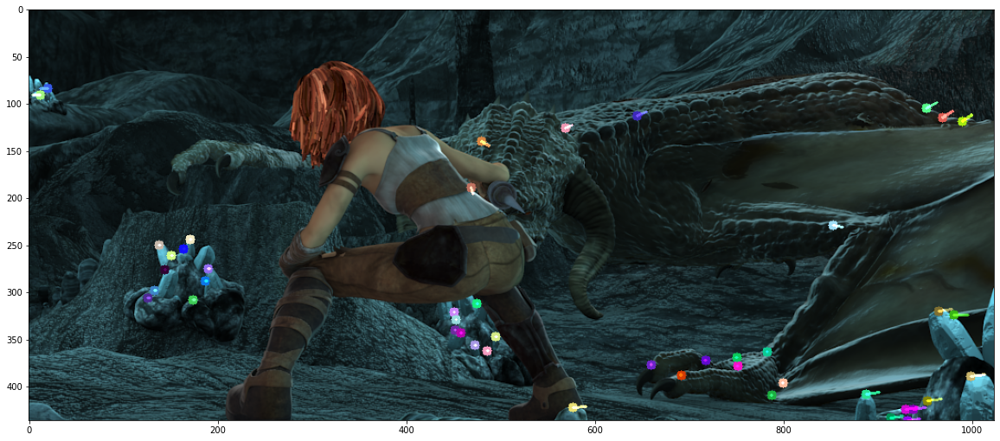

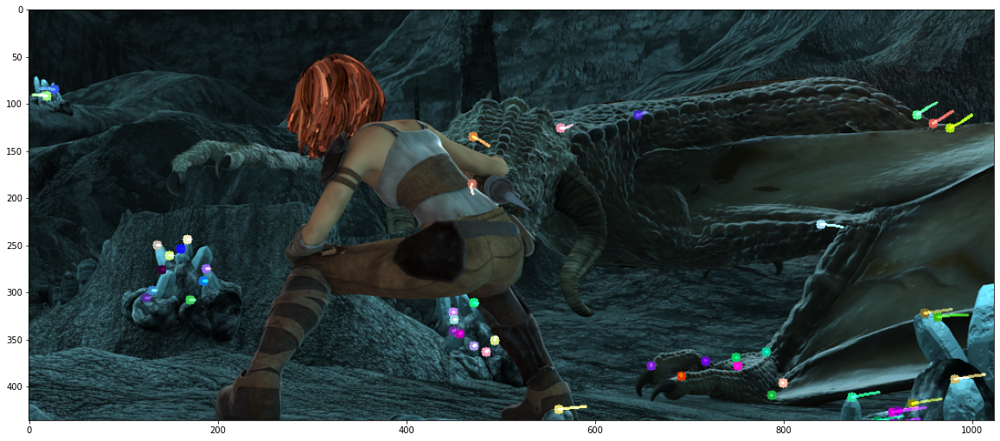

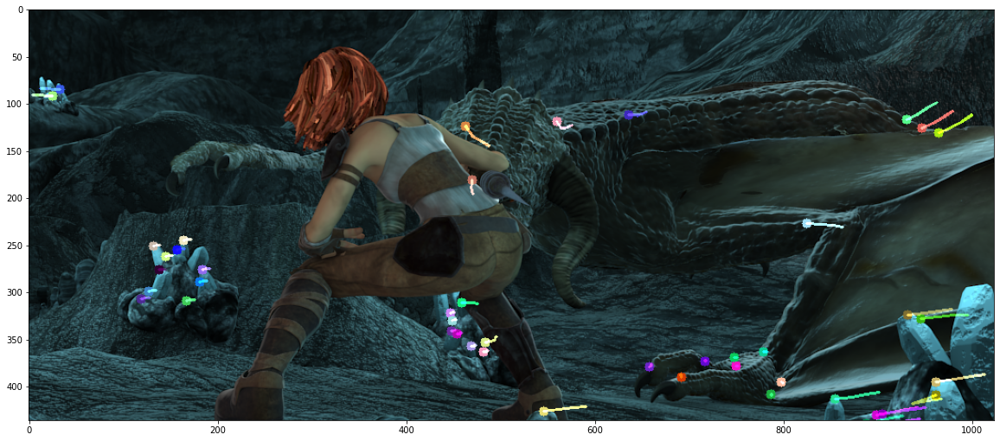

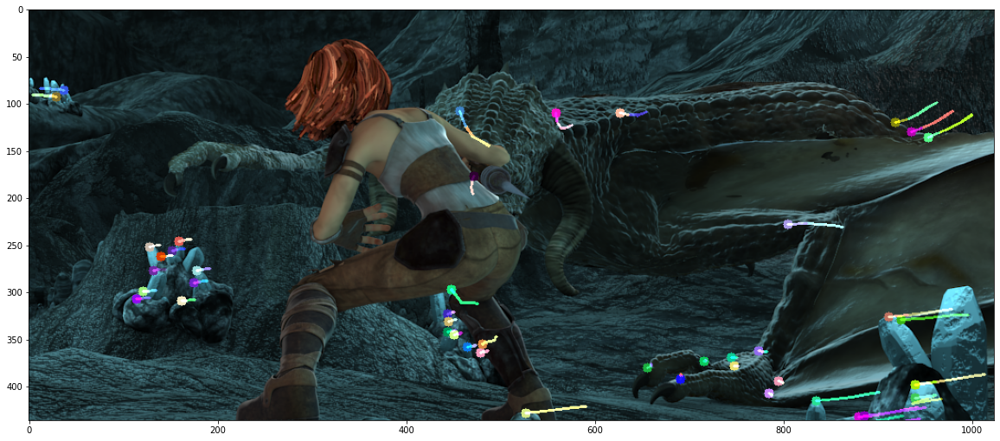

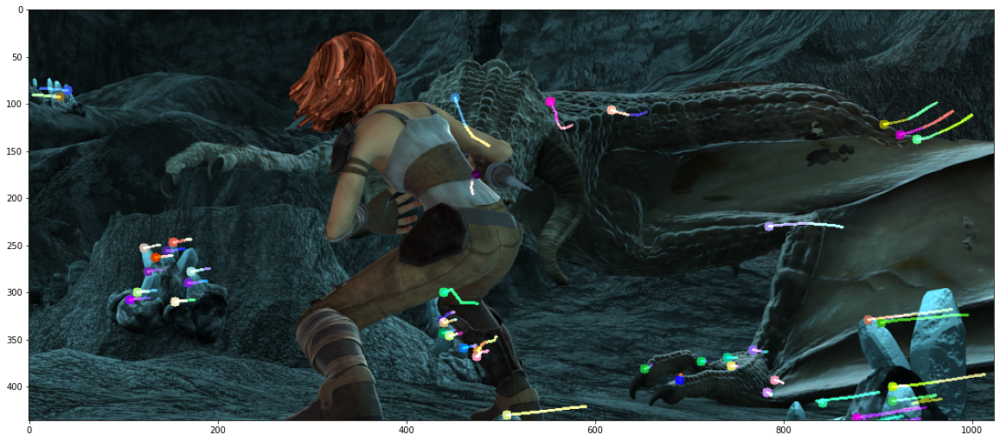

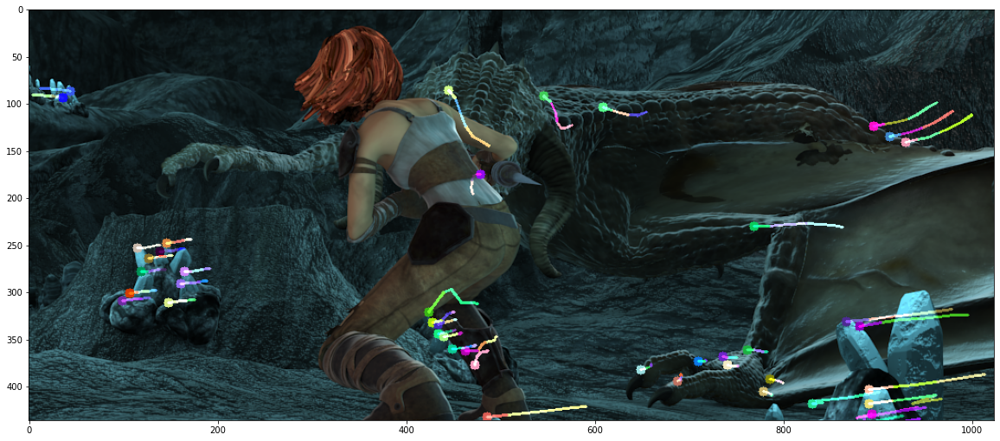

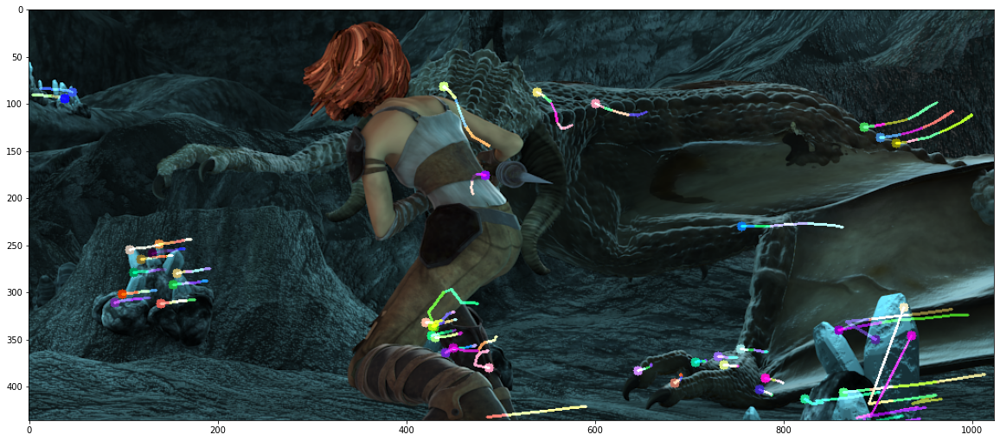

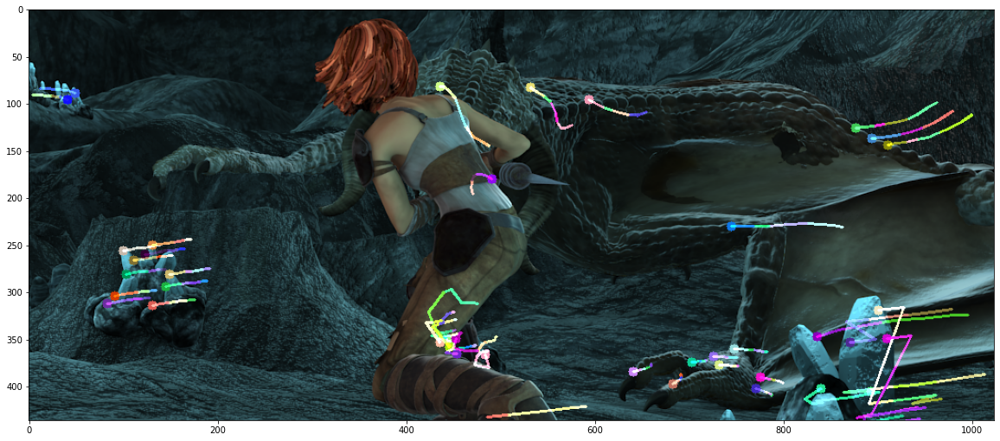

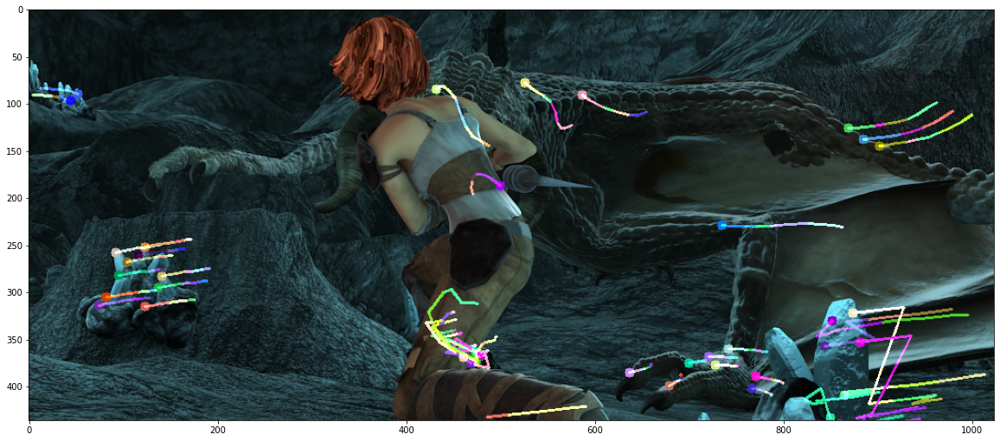

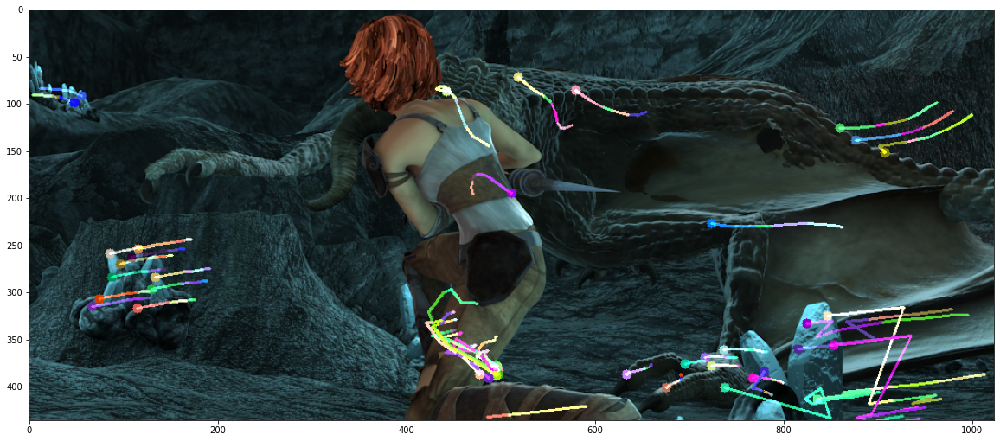

In [4]:
import numpy as np
import cv2
from imutils import paths
import matplotlib.pyplot as plt
from scipy import signal

def lk_optical_flow(I1g, I2g, window_size, tau=1e-2):
    # https://sandipanweb.wordpress.com/2018/02/25/implementing-lucas-kanade-optical-flow-algorithm-in-python/ 
    kernel_x = np.array([[-1., 1.], [-1., 1.]])
    kernel_y = np.array([[-1., -1.], [1., 1.]])
    kernel_t = np.array([[1., 1.], [1., 1.]]) #*.25
    w = window_size/2 # window_size is odd, all the pixels with offset in between [-w, w] are inside the window
    I1g = I1g / 255. # normalize pixels
    I2g = I2g / 255. # normalize pixels
    # Implement Lucas Kanade
    # for each point, calculate I_x, I_y, I_t
    mode = 'same'
    fx = signal.convolve2d(I1g, kernel_x, boundary='symm', mode=mode)
    fy = signal.convolve2d(I1g, kernel_y, boundary='symm', mode=mode)
    ft = signal.convolve2d(I2g, kernel_t, boundary='symm', mode=mode) + \
         signal.convolve2d(I1g, -kernel_t, boundary='symm', mode=mode)
    u = np.zeros(I1g.shape)
    v = np.zeros(I1g.shape)
    # within window window_size * window_size
    for i in range(w, I1g.shape[0]-w):
        for j in range(w, I1g.shape[1]-w):
            Ix = fx[i-w:i+w+1, j-w:j+w+1].flatten()
            Iy = fy[i-w:i+w+1, j-w:j+w+1].flatten()
            It = ft[i-w:i+w+1, j-w:j+w+1].flatten()
            #b = ... # get b here
            #A = ... # get A here
            # if threshold τ is larger than the smallest eigenvalue of A'A:
            nu = ... # get velocity here
            u[i,j]=nu[0]
            v[i,j]=nu[1]
 
    return (u,v)

def optical_flow(image_folder,show_n=4):
    imagePaths = sorted(list(paths.list_images(image_folder)))
    images = []

    # images to stitch list
    for imagePath in imagePaths:
        image = cv2.imread(imagePath)
        images.append(image)

    # params for ShiTomasi corner detection
    feature_params = dict( maxCorners = 100,
                        qualityLevel = 0.3,
                        minDistance = 7,
                        blockSize = 7 )

    # Parameters for lucas kanade optical flow
    lk_params = dict( winSize  = (15,15),
                    maxLevel = 2,
                    criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))

    # Create some random colors
    color = np.random.randint(0,255,(100,3))

    # Take first frame and find corners in it
    old_frame = images[0]
    old_gray = cv2.cvtColor(old_frame, cv2.COLOR_BGR2GRAY)
    p0 = cv2.goodFeaturesToTrack(old_gray, mask = None, **feature_params)

    # Create a mask image for drawing purposes
    mask = np.zeros_like(old_frame)
    i = 0
    n = min(show_n + 1,len(images)) - 1
    while i < n:
        i += 1
        frame = images[i]
        frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # calculate optical flow
        p1, st, err = cv2.calcOpticalFlowPyrLK(old_gray, frame_gray, p0, None, **lk_params)

        # Select good points
        good_new = p1[st==1]
        good_old = p0[st==1]

        # draw the tracks
        for j,(new,old) in enumerate(zip(good_new,good_old)):
            new = new.astype('int32')
            old = old.astype('int32')
            a,b = new.ravel()
            c,d = old.ravel()
            mask = cv2.line(mask, (a,b),(c,d), color[j].tolist(), 2)
            frame = cv2.circle(frame,(a,b),5,color[j].tolist(),-1)

        img = cv2.add(frame,mask)

        img2 = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(20, 15))
        plt.imshow(img2)
        plt.show()
        
        # Now update the previous frame and previous points
        old_gray = frame_gray.copy()
        p0 = good_new.reshape(-1,1,2)


# image_folder = './data/Army'
image_folder = './data/cave_3'
optical_flow(image_folder,show_n=10)

In [33]:
from skimage.color import rgb2gray
from skimage.data import stereo_motorcycle
from skimage.registration import optical_flow_ilk
reference_image, moving_image, disp = stereo_motorcycle()
# --- Convert the images to gray level: color is not supported.
reference_image = rgb2gray(reference_image)
moving_image = rgb2gray(moving_image)
flow = optical_flow_ilk(moving_image, reference_image)

flow

array([[[ 0.21460846,  0.21199091,  0.20031683, ...,  0.        ,
          0.        ,  0.        ],
        [ 0.21459518,  0.21168013,  0.20008034, ...,  0.        ,
          0.        ,  0.        ],
        [ 0.21851519,  0.21553755,  0.20320988, ...,  0.        ,
          0.        ,  0.        ],
        ...,
        [-0.35807207, -0.36533052, -0.38641718, ..., -6.937966  ,
         -6.87267   , -6.8188095 ],
        [-0.49170148, -0.48325163, -0.48276067, ..., -7.159887  ,
         -7.1417084 , -7.0916166 ],
        [-0.47015256, -0.48364785, -0.4622649 , ..., -7.1435804 ,
         -7.132416  , -7.066984  ]],

       [[ 9.1708975 ,  9.170107  ,  9.1602    , ...,  0.        ,
          0.        ,  0.        ],
        [ 9.17026   ,  9.171076  ,  9.159463  , ...,  0.        ,
          0.        ,  0.        ],
        [ 9.161756  ,  9.161687  ,  9.151638  , ...,  0.        ,
          0.        ,  0.        ],
        ...,
        [57.805405  , 57.83792   , 57.803867  , ...,  